# Выделение облаков на космических снимках

В настоящем проекте рассмотрены методы машинного обучения, компьютерного зрения для выделения облаков на космических снимках. В качестве набора данных, из которого взяты некоторые снимки, выбран датасет [38-Cloud: Cloud Segmentation in Satellite Images](https://www.kaggle.com/datasets/sorour/38cloud-cloud-segmentation-in-satellite-images), содержащий изображения Landsat 8 и попиксельные маски облаков без добваления класса теней от облаков. Снимки имеют размер 384*384 пикселя с 4 каналами: Blue (синий), Green (зеленый), Red (красный) и Near Infrared (ближний инфракрасный) и с маской облаков. Для данного проекта использовано только 48 снимков из-за ограниченных вычислительных мощностей.

In [1]:
pip install earthpy spyndex

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 728.7/728.7 kB 17.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.7/134.7 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.7/224.7 kB 11.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 56.4 MB/s eta 0:00:00
  Created wheel for spyndex: filename=spyndex-0.6.0-py3-none-any.whl size=768300 sha256=f753eb0fa420efc126a4432a704b275ff077e8a4f25134b5f36dd891321ddc26
  Stored in directory: /root/.cache/pip/wheels/18/31/87/66b320389980d8680f8696f6e4cd656d00cf2bc06e4cb2b216
  Created wheel for eemont: filename=eemont-0.3.6-py3-none-any.whl size=135742 sha256=4dcebd0ba913f5c3fee9e1c9b5e0e67806f08f8d02fdb37319badae89be488b5
  Stored in directory: /root/.cache/pip/wheels/c2/79/2c/4fed17

In [2]:
import os
import warnings
import re
import random
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.image as io
import seaborn as sns
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler, PolynomialFeatures, QuantileTransformer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    precision_score,
    recall_score,
    f1_score,
)
from skimage.util import img_as_ubyte
import earthpy.plot as ep
import spyndex
from skimage.filters import threshold_otsu, threshold_multiotsu
from scipy.ndimage import median_filter
from scipy import stats
import joblib

warnings.simplefilter("ignore")
sns.set_style('darkgrid')
%matplotlib inline

Создадим функцию `load_data` для сбора данных четырех каналов и маски облаков из разных папок в один набор данных, функцию `normalize_channels` нормализации данных (необходимо для некоторых алгоритмов) и функции `make_image_2d` и `from_array_to_dataframe` для перевода изображений из 3d в 2d, где в каждом ряду записано наблюдение-пиксель, а в столбцах - значение спектральной яркости в четырех каналах:

In [3]:
def load_data(i):
    
    blue_channel = os.listdir('/kaggle/input/38cloud-cloud-segmentation-in-satellite-images/38-Cloud_training/train_blue')[i]
    green_channel = blue_channel.replace('blue', 'green')
    red_channel = blue_channel.replace('blue', 'red')
    nir_channel = blue_channel.replace('blue', 'nir')
    gt_channel = blue_channel.replace('blue', 'gt')
    
    blue_channel = io.imread(os.path.join('/kaggle/input/38cloud-cloud-segmentation-in-satellite-images/38-Cloud_training/train_blue',
            blue_channel)) 
    green_channel = io.imread(os.path.join('/kaggle/input/38cloud-cloud-segmentation-in-satellite-images/38-Cloud_training/train_green',
            green_channel))
    red_channel = io.imread(os.path.join('/kaggle/input/38cloud-cloud-segmentation-in-satellite-images/38-Cloud_training/train_red',
            red_channel))
    nir_channel = io.imread(os.path.join('/kaggle/input/38cloud-cloud-segmentation-in-satellite-images/38-Cloud_training/train_nir',
            nir_channel))
    gt_channel = io.imread(os.path.join('/kaggle/input/38cloud-cloud-segmentation-in-satellite-images/38-Cloud_training/train_gt',
            gt_channel))
    
    image_dataset = np.zeros(
            (384, 384, 5), dtype=np.float64
        )
    
    image_dataset[:, :, 0] = blue_channel
    image_dataset[:, :, 1] = green_channel
    image_dataset[:, :, 2] = red_channel
    image_dataset[:, :, 3] = nir_channel
    image_dataset[:, :, 4] = gt_channel

    non_zero_count = np.count_nonzero(image_dataset)

    if non_zero_count >= 737280*0.8:
        return image_dataset


def normalize_channels(image_dataset, n_channels):
        
    for b in range(n_channels):
        image_dataset[:, :, b] = np.nan_to_num(image_dataset[:, :, b])
        min_val_b = np.min(image_dataset[:, :, b])
        max_val_b = np.max(image_dataset[:, :, b])
        image_dataset[:, :, b] = (image_dataset[:, :, b] - min_val_b) / (
            max_val_b - min_val_b)
        
    return image_dataset


def make_image_2d(image_dataset):

    if image_dataset.ndim == 3:
        new_shape = (image_dataset.shape[0] * image_dataset.shape[1],
            image_dataset.shape[2])
        img_as_2d_arr = image_dataset[:, :, :].reshape(new_shape)
    elif image_dataset.ndim == 2:
        new_shape = (image_dataset.shape[0] * image_dataset.shape[1], 1)
        img_as_2d_arr = image_dataset[:, :].reshape(new_shape)
        
    scaler = MinMaxScaler()
    if np.max(img_as_2d_arr) != 0:
        img_as_2d_arr = scaler.fit_transform(img_as_2d_arr)

    return img_as_2d_arr
    

def from_array_to_dataframe(img_as_2d_arr):
    
    data = {
        "blue": img_as_2d_arr[:, 0],
        "green": img_as_2d_arr[:, 1],
        "red": img_as_2d_arr[:, 2],
        "nir": img_as_2d_arr[:, 3],
        "cloud": img_as_2d_arr[:, 4],
    }
    data = pd.DataFrame(data)

    return data

In [4]:
image_datasets = []
lst_X = []

Создадим набор данных изображений из первых 100 элементов. Многие снимки, как уже было сказано выше, не будут включены в набор данных, поэтому на самом деле в списке `image_datasets` окажется меньше снимков:

In [5]:
for i in tqdm(range(100)):
    image_dataset = load_data(i)
    if image_dataset is not None:
        image_dataset = normalize_channels(image_dataset, 4)
        image_2d_df = from_array_to_dataframe(make_image_2d(image_dataset))
        image_datasets.append(image_dataset)
        lst_X.append(image_2d_df)

100%|██████████| 100/100 [00:12<00:00,  8.11it/s]


In [6]:
len(image_datasets)

48

Всего в списке расположено 48 снимков. Практически половина снимков была не сохранена из-за высокой доли снимков с нулевыми пикселями. Соединим матрицы объект-признак и вектора целевого признака в матрицу `X`, в которой все наблюдения-пиксели, для которых есть 4 исходных признака и вектор `y` для тех же наблюдений-пикселей, для которых есть метка класса. 0 означает отсутствие облаков в пикселе, в то время как 1 означает их наличие.


In [7]:
X = pd.concat(lst_X)
y = X['cloud']

X.reset_index(drop=True, inplace=True)
y.reset_index(drop=True, inplace=True)

X.drop('cloud', axis=1, inplace=True)

## Исследовательский анализ данных

Матрица объект-признак включает в себя 4 признака: яркость в синем (`blue`), зеленом (`green`), красном (`red`) и ближнем инфракрасном (`nir`) каналах для каждого из пикселей-наблюдений. Для набора данных проведен исследовательский анализ данных: подсчитаны основные дескриптивные статистики, построены гистограммы распределений, графики "ящик с усами" для анализа выбросов и корреляционная матрица для анализа зависимости между признаками.

Ниже приведены дескриптивные статистики для каждой из 4-х независимых переменных и целевой бинарной переменной наличия облаков:

In [8]:
X.describe()

,blue,green,red,nir
count,7.077888e+06,7.077888e+06,7.077888e+06,7.077888e+06
mean,3.282920e-01,3.282478e-01,3.295447e-01,3.856526e-01
std,2.611052e-01,2.517485e-01,2.492442e-01,2.210083e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,7.334915e-02,9.055905e-02,9.533699e-02,2.102535e-01
50%,3.008759e-01,3.025061e-01,3.068216e-01,3.657832e-01
75%,5.299549e-01,5.102004e-01,5.101055e-01,5.396320e-01
max,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


In [9]:
y.value_counts(normalize=True)

cloud
0.0    0.700482
1.0    0.299518
Name: proportion, dtype: float64

Распределения спектральных яркостей в четырех каналах практически совпадают друг с другом. Так, первый квартиль у трех каналов (кроме ближнего инфракрасного) меньше 0.1, а третий квартиль варьируется около 0.5. Это говорит о том, что спектральная яркость большинства пикселей довольно низкая, а значит пиксели с облаками, которые обычно характеризуются высокими значениями яркости в видимом спектре, встречаются редко. Частота встречаемости классов подсчитана для вектора `y`, и она составляет чуть более 0.7 для нулевого класса и почти 0.3 для класса облаков. Дисбаланс в классах необходимо учитывать при настройке модели машинного обучения и подборе метрики качества классификации. Минимальное значение яркости в ближнем инфракрасном канале заметно выше минимума у трех видимых каналов из-за увеличения спектральной яркости в данном канале практически у всех объектов (растительность, городская застройка), кроме водных.

Построим гистограмму распределения значений спектральной яркости у признаков:

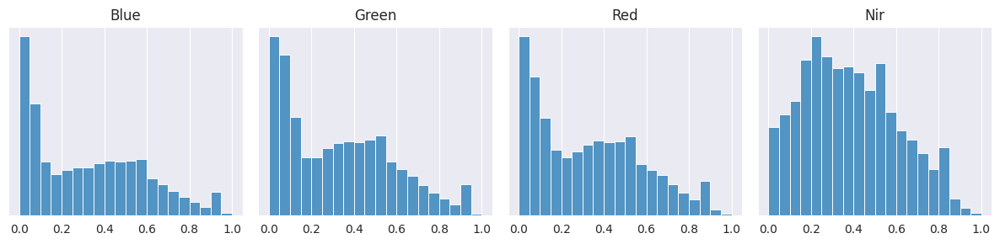

In [10]:
fig, axes = plt.subplots(1, 4, figsize=(12, 3))
axes = axes.ravel()
for indx, column in enumerate(list(X.columns)):
    sns.histplot(X[column], bins=20, ax=axes[indx])
    axes[indx].set_title(column.capitalize())
    axes[indx].set_xlabel('')
    axes[indx].set_ylabel('')
    axes[indx].set_yticks([])
plt.tight_layout()

На гистограммах распределения яркости видно, что большинство пикселей приобретает нулевые значения, так как пик у первых трех графиков расположен на нуле. Это подтверждает наше предположение, что в среднем яркость пикселей достаточно низкая и что облака в наборе данных встречаются крайне редко. Второй пик у гистограмм яркости видимых каналов наблюдается в диапазоне 0.55 - 0.6, но он значительно меньше по сравнению с первым пиком. Данный пик относится как к менее плотным облакам, которые увеличивают яркость пикселей (хотя наземная поверхность уменьшает яркость до средних значений), так и к остальным объектам, не покрытыми облаками. Совсем небольшой пик наблюдается на значении 0.9 - этот пик идентифицирует более плотные облака, но может также и относится к бликам на антропогенных поверхностях (таких, как крыши зданий), снегу, песчаным поверхностям и другим достаточно ярким объектам.

Совсем другое распределение наблюдается у ближнего инфракрасного канала. Здесь в среднем яркость у объектов оказывается выше. Пикселей с нулевыми значениями оказалось меньше и пик в количестве пикселей наблюдается в диапазоне 0.2 - 0.25. Возможно, что преимущественное большинство пикселей относится к наземной поверхности, а не к водным объектам. Пик для наиболее ярких объектов — облака, снег, песок и антропогенные объекты — оказался побольше, но он меньше пика для объектов со средней яркостью.

In [11]:
corr_matrix = X.corr()
corr_matrix

,blue,green,red,nir
blue,1.000000,0.996165,0.991397,0.928464
green,0.996165,1.000000,0.997656,0.945443
red,0.991397,0.997656,1.000000,0.950888
nir,0.928464,0.945443,0.950888,1.000000


In [12]:
X_y_corr = X.apply(lambda x: x.corr(y))
print(X_y_corr)

blue     0.422114
green    0.404171
red      0.389708
nir      0.344827
dtype: float64


Корреляционная матрица показывает очень высокую корреляцию между всеми спектральными каналами, которая может достигать единицы. Это означает, что при увеличении яркости в определенном канале увеличивается яркость во всех остальных каналах. С целевым признаком сильнее всего коррелирует яркость в синем канале, хотя связь трудно назвать сильной, так как корреляция меньше 0.5. Слабее всего коррелирует яркость в ближнем инфракрасном канале. Это соответствует действительности - в синем канале яркость облаков достигает максимальных значений, в то время как в ближнем инфракрасном канале она минимальна среди четырех каналов.

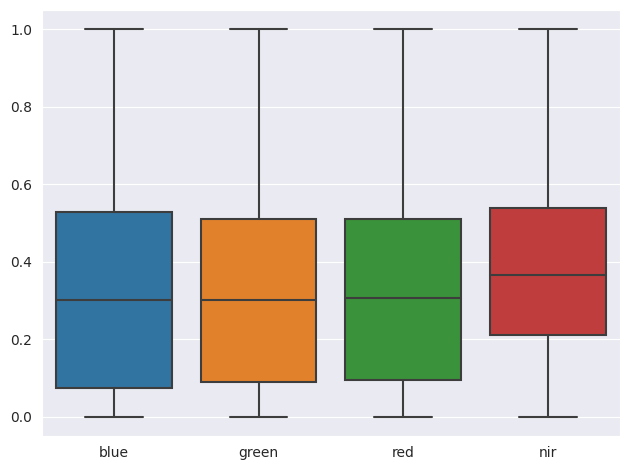

In [13]:
plt.figure()
sns.boxplot(data=X)
plt.tight_layout()

Как видно на графике "ящик с усами", в наборе данных отсутствуют выбросы, ведь они были заменены нулями еще на этапе предварительной обработки данных. Предположение о преобладании пикселей с низкими значениями яркости подтвердилось и на данных графиках. Видно, что в среднем яркость в ближнем инфракрасном канале выше по сравнению с остальными каналами, что тоже было предположено на этапе расчетов дескриптивной статистики.

Сделаем визуализацию некоторых снимков набора данных:

In [14]:
composite_images = []

for i in range(10):
    composite_image = np.moveaxis(image_datasets[i], 2, 0)
    composite_images.append(composite_image)

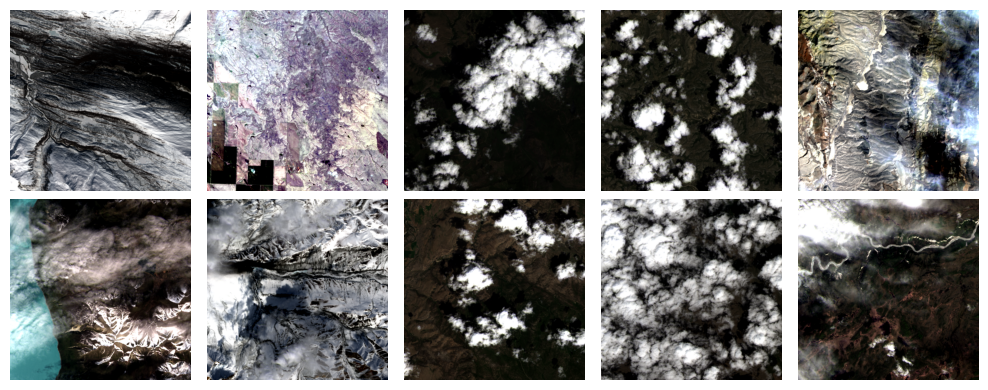

In [15]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(10, 4))
axes = axes.ravel()
for i in range(10):
    ep.plot_rgb(composite_images[i], rgb=[2, 1, 0], ax=axes[i], stretch=True, str_clip=4)
    axes[i].axis('off')
plt.tight_layout()

На данных снимках представлены облака различных типов - как более плотные перистые облака, так и менее плотная облачная дымка. Помимо облаков, на снимках представлены разные типы наземных поверхностей - водные объекты, растительность, пустыня, заснеженные поверхности. Возможно, что последние два типа наземных поверхностей и городская застройка (в особенности блики от антропогенных поверхностей) воспрепятствуют успешному выделению облаков от остальных объектов из-за высокой спектральной яркости практически во всех каналах. Кроме того, необходимо рассмотреть вопрос выделения менее плотных облаков, ведь значения спектральной яркости таких облаков ниже, чем у более плотных облаков. 

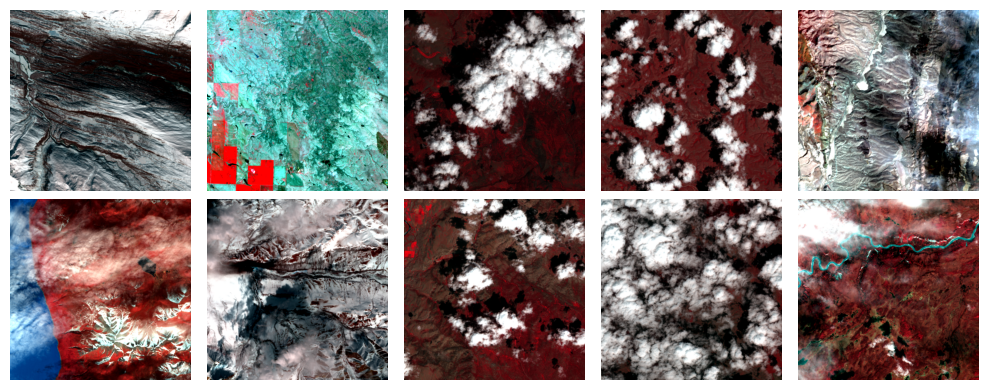

In [16]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(10, 4))
axes = axes.ravel()
for i in range(10):
    ep.plot_rgb(composite_images[i], rgb=[3, 2, 1], ax=axes[i], stretch=True, str_clip=4)
    axes[i].axis('off')
plt.tight_layout()

На снимках синтеза NIR-Red-Green облака все также же сложно отделить от пустыни или снега. Возможно для отделения двух объектов необходимо использовать специальные спектральные индексы. Однако такой индекс как разностный индекс снега (англ. NDSI) невозможно применить из-за нехватки коротковолнового инфракрасного канала.

## Выделение облаков с использованием спектрального индекса

Еще один быстродействующий метод для выделения облаков на космических снимках - использование спектральных индексов, разработанных в статье ["Cloud/shadow detection based on spectral indices for multi/hyperspectral optical remote sensing imagery"](http://www.lmars.whu.edu.cn/prof_web/zhanghongyan/papers/Cloud_Shadow%20Detection%20Framework%20based%20on%20Spectral%20Indices%20for%20Multi_Hyperspectral%20Optical%20Remote%20Sensing%20Imagery.pdf). Алгоритм, названный авторами как CSD-SI (англ. Cloud/Shadow Detection based on Spectral Indices), выполняет шаги по расчету двух спектральных индексов, применению пороговых значений и медианного фильтра на последнем шаге. Первый индекс `cloud_index_1` призван отделить облака по спектральным характеристикам в четырех каналах от остальных объектов. Формула индекса следующая:

$CI1 = \frac{3*B_{NIR}}{B_{B} + B_{G} + B_{R}}$,

где $B_{NIR}$ - яркость в БИК, $B_{B}$ - яркость в синем канале, $B_{G}$ - яркость в зеленом канале и $B_{R}$ - яркость в красном канале. Для облаков, отличающимися низкими значениями яркости в БИК относительно видимого спектра, значение индекса $CI1$ лежит в узком диапазоне вокруг единицы.

Второй индекс `cloud_index_2` выделяет облака на основе их высокого значения яркости во всех каналах. Индекс рассчитывается как средняя яркость во всех каналах. Формула данного индекса:

$CI2 = \frac{B_{B} + B_{G} + B_{R} + B_{NIR}}{4}$

Далее к получившимся картам двух индексов применяются пороги. Для первого индекса ставится порог, близкий к единице, а для второго индекса - относительно близкий к максимальному значению яркости. Полученные маски объединяются, и над ними применяется медианный фильтр для удаления шума.

In [17]:
def calculate_cloud_mask(image):
    
    cloud_index_1 = (3*image[:, :, 3])/(image[:, :, 0]+image[:, :, 1]+image[:, :, 2])
    cloud_index_2 = (image[:, :, 0]+image[:, :, 1]+image[:, :, 2]+image[:, :, 3])/4

    pre_cloud_mask = (cloud_index_1 <= 1.25) | (cloud_index_2 >= 0.45)

    cloud_mask = median_filter(pre_cloud_mask, size=3)

    return cloud_index_1, cloud_index_2, cloud_mask

In [18]:
cloud_index_1_results = []
cloud_index_2_results = []
cloud_masks = []
for image in image_datasets:
    cloud_idx_1 = calculate_cloud_mask(image)[0]
    cloud_idx_2 = calculate_cloud_mask(image)[1]
    cloud_index_1_results.append(cloud_idx_1)
    cloud_index_2_results.append(cloud_idx_2)
    cloud_mask = calculate_cloud_mask(image)[-1]
    cloud_masks.append(cloud_mask)

In [19]:
center_value = 1
cmap = plt.get_cmap('twilight_shifted')
norm_cmap = mcolors.TwoSlopeNorm(vmin=0, vcenter=center_value, vmax=10)

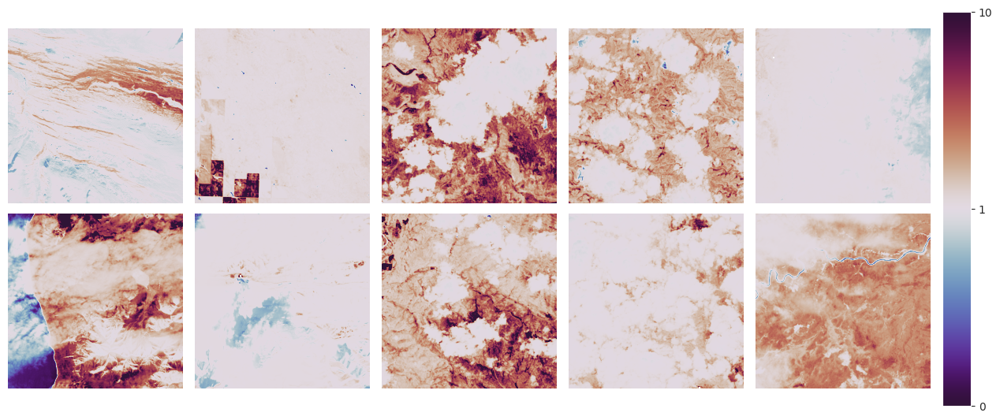

In [20]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(12, 5))
axes = axes.ravel()
for i, image in enumerate(cloud_index_1_results[:10]):
    im = axes[i].imshow(cloud_index_1_results[i], cmap='twilight_shifted', norm=norm_cmap)
    axes[i].axis('off')
cbar_ax = fig.add_axes([1, 0, 0.03, 1])
fig.colorbar(im, cax=cbar_ax, ticks=[0, 1, 10])
plt.tight_layout()

На картах индекса $CI1$ видно, что на изображениях с плотными облаками облака успешно отделяются от остальных объектов, хотя на изображениях с полным отсутствием облаков индекс не может корректно отделять облака от остальных объектов. Индекс часто путает облака с аналогично яркими объектами, такими как снег или песок.

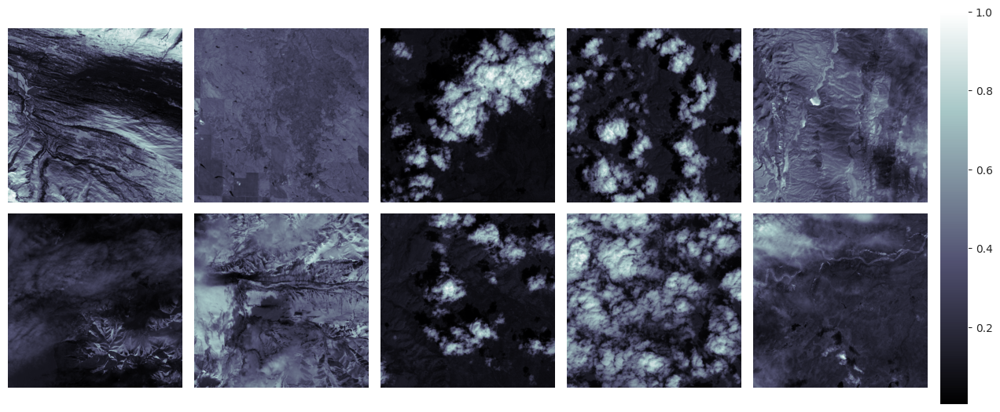

In [21]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(12, 5))
axes = axes.ravel()
for i, image in enumerate(cloud_index_2_results[:10]):
    im = axes[i].imshow(cloud_index_2_results[i], cmap='bone')
    axes[i].axis('off')
cbar_ax = fig.add_axes([1, 0, 0.03, 1])
fig.colorbar(im, cax=cbar_ax)
plt.tight_layout()

Индекс $CI2$, как и предыдущий индекс, хорошо выделяет более плотные облака, однако он также не умеет отделять облака от других самых ярких объектов. Для снега и песка средняя яркость тоже оказалась довольно высокой. Ожидается, что и комплексный алгоритм не сумеет успешно выделить облака.

In [22]:
flat_cloud_masks = [arr.flatten() for arr in cloud_masks[38:]]
y_pred_cloud_index = np.concatenate(flat_cloud_masks)

In [23]:
y_test = y[384*384*38:]

print("Precision:", round(precision_score(y_test, y_pred_cloud_index), 3))
print("Recall:", round(recall_score(y_test, y_pred_cloud_index), 3))
print("F1 score:", round(f1_score(y_test, y_pred_cloud_index), 3))

Precision: 0.542
Recall: 0.872
F1 score: 0.668


Алгоритм CSD-SI показал средний результат по выделению облаков, более высокий по отношению к алгоритму бинаризации Otsu. Так, метрика f1score достигла значения 0.66. При этом в случае с алгоритмом CSD-SI метрика recall оказалась выше, а метрика precision - ниже по сравнению с алгоритмом Otsu. Алгоритм переоценивает положительные метки - среди всех предсказанных алгоритмом меток облаков лишь чуть более половины действительно относится к облакам.

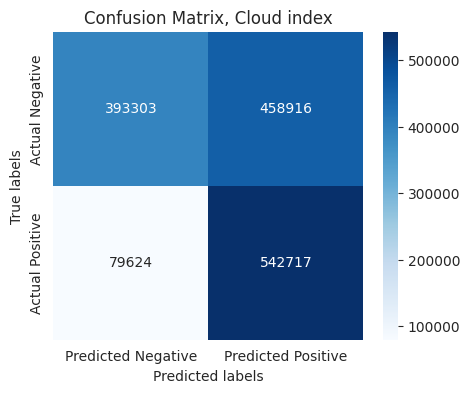

In [24]:
cm = confusion_matrix(y_test, y_pred_cloud_index)
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=['Predicted Negative', 'Predicted Positive'], yticklabels=['Actual Negative', 'Actual Positive'])
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix, Cloud index')
plt.show()

По сравнению с предыдущим алгоритмом, алгоритм CSD-SI преувеличивает число "облачных" пикселей. Около 450 тыс. пикселей были распознаны таковыми, при этом около 542 тыс. пикселей в действительности относятся к облакам, поэтому переоценку пикселей с положительными метками можно назвать значительной. Стоит отметить, что алгоритм, с другой стороны, практически не пропускает облачные пиксели, что показывает высокий результат метрики recall.

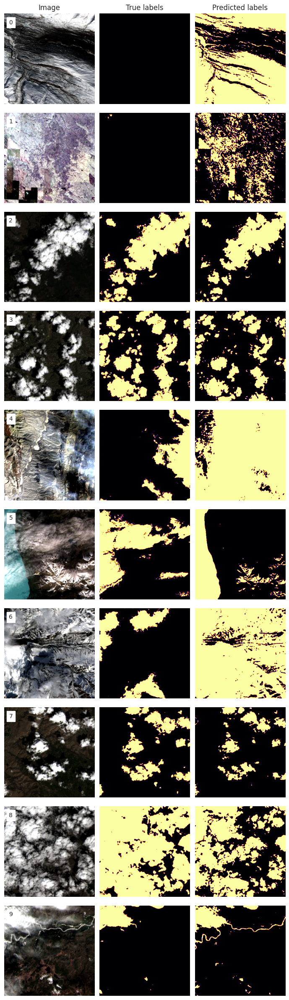

In [25]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(7, 24))
for i in range(10):
    ep.plot_rgb(composite_images[i], rgb=[2, 1, 0], ax=axes[i, 0], stretch=True, str_clip=4)
    axes[i, 0].axis('off')
    axes[i, 0].text(20, 45, str(i), bbox=dict(facecolor='white'))
    axes[i, 1].imshow(image_datasets[i][:, :, 4], cmap='inferno')
    axes[i, 1].axis('off')
    axes[i, 2].imshow(cloud_masks[i], cmap='inferno')
    axes[i, 2].axis('off')
axes[0, 0].set_title('Image')
axes[0, 1].set_title('True labels')
axes[0, 2].set_title('Predicted labels')
plt.tight_layout()

Ошибки, которые выполняет алгоритм CSD-SI, схожи с ошибками, которые выполняет алгоритм Multi-Otsu при выделении облаков на снимках. Это прежде всего невозможность отделить облака от самых объектов земной поверхности - снег и песок.

## Алгоритм Fmask для выделения облаков

Алгоритм Fmask - еще один полуавтоматический алгоритм выделения облаков на космических снимках. Описание алгоритма проводится в статье ["Object-based cloud and cloud shadow detection in Landsat imagery"](https://gerslab.cahnr.uconn.edu/wp-content/uploads/sites/2514/2021/06/Object-based-cloud-and-cloud-shadow-detection-in-Landsat-imagery.pdf). Алгоритм основан на множестве тестов по поиску облаков и изначально разработан для данных Landsat, однако у алгоритма возникли модификации и для снимков без теплового канала. Стоит отметить, что из-за отсутствия теплового канала и канала Cirrus, который позволяет находить менее плотные облака, алгоритм окажется более урезанным и поэтому он может показать более низкое качество выделения облаков.

Производится 2 теста. Первый тест выделяет потенциальные облачные пиксели, а второй тест - вероятность возникновения облаков у пикселей воды и земной поверхности, что помогает выделить менее плотные облака. Первый тест состоит из нескольких подтестов:

- Базовый тест (Basic test). В нашем случае мы сможем рассчитать только значение индекса NDVI, в то время как оригинальный тест рассчитывает в дополнение к NDVI индекс снега NDSI и использует тепловой канал. Для индекса NDVI устанавливается достаточно высокий порог 0.8
- Тест на яркость (Whiteness test). Тест основан на выделении облаков на основе их спектральной яркости. Расчет производится по формулам:

$\text{MeanVis} = \frac{\text{Band 1} + \text{Band 2} + \text{Band 3}}{3}$

$\text{Whiteness Test} = \left| \sum_{i=1}^{3} \frac{\text{Band}i - \text{MeanVis}}{\text{MeanVis}} \right| < 0.7$

По сравнению с остальными объектами, спектральный профиль которых значительно изменяется в разных каналах, спектральный профиль облаков однороден - во всех видимых каналах облака обладают высокими значениями спектральной яркости. Whiteness test выделяет пиксели, в которых сумма отклонений от среднего значения яркости в трех каналах у данного пикселя достаточно низка, к таким объектами относятся облака.

- Оптимизированный тест на трансформацию дымки (Haze Optimized Transformation (HOT) Test). Тест отделяет менее плотные облака (дымка) от наземных объектов. В видимом спектре для большинства поверхностей суши наблюдается сильная корреляция в яркости, а спектральный отклик на тонкие облака различается между синим и красным каналом. Тест рассчитывается по формуле:

$\text{HOT Test} = \text{Band 1} - 0.5 \cdot \text{Band 3} - 0.08 > 0$

- B4/B5 Test. Из-за отсутствия 5-го канала данный тест не был проведен. Идея теста заключается в отделении облаков от аналогичных ярких объектов, таких как каменистая или песчаная поверхность.

- Тест на выделение водных пикселей (Water test). Тест отделяет водные пиксели от остальных пикселей на основе значений индекса NDVI, он необходим для второго теста. В качестве порогового значения индекса устанавливается значение 0.01

Пересекая получившиеся выше бинарные маски, получают маску потенциальных облачных пикселей (Potential cloud pixels, PCP). 

Во втором тесте производится разделение пикселей на пиксели воды и земной поверхности, затем для каждого из двух типов пикселей проводятся свои тесты. Второй тест для **водных** пикселей состоит из следующих подтестов:

- Температурная вероятность воды (Temperature Probability for Water). Тест выделяет водные пиксели на основе теплового канала - вода обладает самыми низкими значениями температуры. Тест не был применен из-за отсутствия теплового канала.
- Яркостная вероятность воды (Brightness Probability). В коротковолновом инфракрасном канале спектральная яркость воды крайне низка, поэтому пиксели с низкой яркостью с более высокой вероятностью относятся к воде. Для данного теста коротковолновый канал заменен на ближний инфракрасный, так как и в этом канале яркость воды также низка. Пороговое значение яркости - 0.11
- На основе температурной и яркостной вероятности рассчитывается вероятность облачных пикселей у водных пикселей. В нашем случае мы используем только яркостную вероятность. Пороговое значение - 0.5

Пиксели **земной** поверхности извлекаются из маски потенциальных облаков, полученной на первом шаге и из маски водных пикселей. Для пикселей земных поверхностей проводятся следующие тесты:

- Температурная вероятность земной поверхности (Temperature Probability). Земная поверхность обладает повышенными значениями температуры по сравнению с водой или облаками. Данный тест не был применен из-за отсутствия теплового канала.
- Вероятность изменчивости (Variability Probability). Основан на идее о том, что облака имеют относительно однородный спектральный отклик, в то время как поверхности суши могут иметь широкий диапазон отклика. Тест вероятности изменчивости поверхности использует два спектральных индекса - модифицированный индекс NDVI и NDSI - и значение яркости `whiteness`, рассчитанный в тесте на яркость для поиска наибольшего из трех значений. Формула теста:

$\text{VariabilityProb} = 1 - \max(\text{abs modified NDVI}, \text{abs modified NDSI}, \text{Whiteness})$

В нашем примере мы использовали только модифицированный индекс NDVI и параметр `whiteness`.

- На основе температурной и яркостной вероятности рассчитывается вероятность облачных пикселей у земных пикселей. В нашем случае мы используем только яркостную вероятность. Пороговое значение - 0.5
- Облачные пиксели извлекаются из рассчитанной на предыдущем шаге вероятности с помощью порога, равного 82.5 процентилю вероятности.

Для получения финальной маски облаков используются следующие формулы:

$\text{PCP true} \quad \text{and Water Test true} \quad \text{and } wCloudProb > 0.5 $

$\text{or}$

$\text{PCP true} \quad \text{and Water Test false} \quad \text{and } lCloudProb > \text{LandPthreshold}$

$\text{or}$

$lCloudProb > 0.99 \quad \text{and Water Test false}$,

где $wCloudProb$ - вероятность облаков у водных пикселей и $lCloudProb$ - вероятность облаков у земных пикселей, $LandPthreshold$ - порог для земных пикселей

In [26]:
def fmask_test(image):

    ndvi = (image[:, :, 3] - image[:, :, 2])/(image[:, :, 3] + image[:, :, 2])
    ndvi_test = np.where(ndvi < 0.8, 1, 0)

    mean_br = (image[:, :, 0]+image[:, :, 1]+image[:, :, 2])/3
    whiteness = (np.abs(image[:, :, 0] - mean_br)/mean_br) + (np.abs(image[:, :, 1] - mean_br)/mean_br) + (np.abs(image[:, :, 2] - mean_br)/mean_br)
    whiteness_test = np.where(whiteness < 0.7, 1, 0)

    haze_opt_trans = image[:, :, 0] - 0.5 * image[:, :, 2] - 0.08
    haze_test = np.where(haze_opt_trans > 0, 1, 0) 

    pcp = np.where((ndvi_test > 0) & (whiteness_test > 0) & (haze_test > 0), 1, 0)

    water_pixels = np.where(((ndvi < 0.01) & (image[:, :, 3] < 0.11)) | ((ndvi < 0.1) & (image[:, :, 3] < 0.05)), 1, 0)
    nir_masked = image[:, :, 3] * water_pixels
    water_cloud_prob = np.minimum(nir_masked, 0.11)/0.11
    
    land_pixels = np.where((pcp < 1) & (water_pixels < 1), 1, 0)

    def modified_ndvi(image):

        mndvi = np.zeros(image.shape[:2], dtype=np.float32)
        mask = image[:, :, 3] > image[:, :, 2]
        mndvi[~mask] = (image[~mask, 3] - image[~mask, 2]) / (image[~mask, 3] + image[~mask, 2])
        
        return mndvi
    
    mod_ndvi = modified_ndvi(image)
    mod_ndvi_masked = land_pixels * mod_ndvi
    whiteness_masked = land_pixels * whiteness
    
    land_cloud_prob = 1 - np.maximum(np.abs(mod_ndvi_masked), whiteness_masked)
    land_thresh = np.percentile(land_cloud_prob, 82.5)
    
    pot_cloud_layer = (pcp & water_pixels & (water_cloud_prob > 0.5)) | (pcp & ~water_pixels & (land_cloud_prob > land_thresh)) | ((land_cloud_prob > 0.99) & ~water_pixels)

    return pot_cloud_layer

In [27]:
fmask_results = []
for image in image_datasets:
    pot_cloud_layer = fmask_test(image)
    fmask_results.append(pot_cloud_layer)

In [28]:
flat_fmask_masks = [arr.flatten() for arr in fmask_results[38:]]
y_pred_fmask = np.concatenate(flat_fmask_masks)

In [29]:
print("Precision:", round(precision_score(y_test, y_pred_fmask), 3))
print("Recall:", round(recall_score(y_test, y_pred_fmask), 3))
print("F1 score:", round(f1_score(y_test, y_pred_fmask), 3))

Precision: 0.56
Recall: 0.91
F1 score: 0.694


Алгоритм Fmask оказался более успешным по сравнению с остальными алгоритмами - результат всех трех метрик повысился. Тем не менее метрика precision все так же низка, как и в случае с алгоритмом CSD-SI, что указывает на переоценку облачных пикселей. При этом алгоритм практически не пропускает пиксели с положительными метриками, так как метрика recall оказалась выше 0.9. Вероятная причина такого результата - высокая спектральная яркость песка, снега и многих антропогенных объектов (в особенности блики от зданий), из-за чего данные объекты трудно отличить от облаков. В свою очередь, высокое значение recall может свидетельствовать о способности алгоритма выделять менее плотные облака и дымку так же успешно, как и более плотные облака, ведь пиксели облачных дымок часто можно спутать с остальными объектами и отнести к нулевому классу.

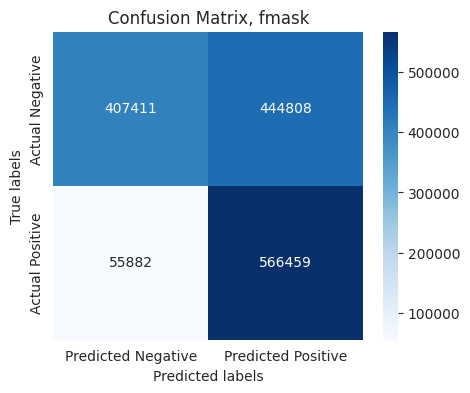

In [30]:
cm = confusion_matrix(y_test, y_pred_fmask)
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=['Predicted Negative', 'Predicted Positive'], yticklabels=['Actual Negative', 'Actual Positive'])
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix, fmask')
plt.show()

На матрице несоответствий видно, что порядка 444 тыс. пикселям тестовой выборки дана метка положительного класса (облака), в то время как данные пиксели в действительности не относятся к облакам. Алгоритм Fmask переоценивает облачные пиксели.

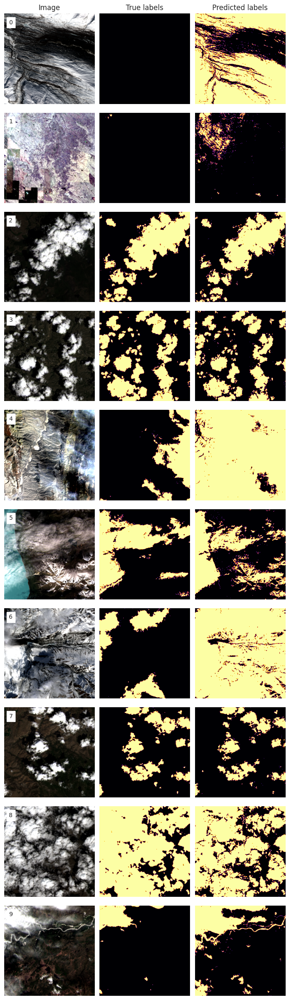

In [31]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(7, 24))
for i in range(10):
    ep.plot_rgb(composite_images[i], rgb=[2, 1, 0], ax=axes[i, 0], stretch=True, str_clip=4)
    axes[i, 0].axis('off')
    axes[i, 0].text(20, 45, str(i), bbox=dict(facecolor='white'))
    axes[i, 1].imshow(image_datasets[i][:, :, 4], cmap='inferno')
    axes[i, 1].axis('off')
    axes[i, 2].imshow(fmask_results[i], cmap='inferno')
    axes[i, 2].axis('off')
axes[0, 0].set_title('Image')
axes[0, 1].set_title('True labels')
axes[0, 2].set_title('Predicted labels')
plt.tight_layout()

Как и в предыдущих случаях, алгоритм Fmask успешно выделил плотные облака, которые заметно отличаются от остальных объектов на снимках высокой яркостью. Однако Fmask способен хотя бы частично выделить менее плотные облака и облачную дымку, из-за чего, возможно, точность выделения облаков оказалась выше аналоговых алгоритмов. Так, на снимке 9 видно, что облачная дымка на севере участка успешно выделилась, хотя дымка ближе к середине снимка смогла выделиться лишь частично. Также на этом снимке ошибочно выделена река в качестве облака. На снимке 6 практически все пиксели отнесены к облакам, хотя на снимке их довольно мало. Вероятно отсутствие в расчетах индекса NDSI привело к таким ошибкам.

## Алгоритмы машинного обучения

Алгоритмы машинного обучения выделяют объекты интереса на основе статистической зависимости между признаками, в отличие от предыдущих алгоритмов как CSD-SI или Fmask, которые выделяют облака на основе эмпирической зависимости. Среди алгоритмов машинного обучения выбраны такие классические алгоритмы как *логистическая регрессия* и *наивный баесовский классификатор*. Преимущество таких методов в том, что они используют сразу несколько признаков для выделения классов.

Изначально в исходном наборе данных даны 4 признака: яркость в синем, зеленом, красном и ближнем инфракрасном каналах. Из данного ограниченного набора признаков подсчитаны такие индексы как NDVI (нормализованный разностный индекс растительности) и NDWI (нормализованный разностный водный индекс), позволяющие отделить растительность и водные объекты от остальных объектов, в том числе от облаков. Помимо данных индексов, в матрицу признаков добавлен спектральный индекс облаков Cloud index 2 и показатели `whiteness` (сумма отклонений значения яркости в каналах от среднего значения яркости пикселя) и `haze_opt_trans` (трансформация дымки), рассмотренные в соответствующем разделе. От многих признаков пришлось отказаться — так, признак Cloud index 1 может возрастать до бесконечности, если все слагаемые в знаменателе окажутся равными нулю, что может быть вполне действительным для водных объектов.

In [32]:
def compute_features(image):

    ndvi = spyndex.computeIndex(
    index = ["NDVI"],
    params = {
        "N": image[:, :, 3],
        "R": image[:, :, 2]})
    ndvi_1d = make_image_2d(ndvi)

    ndwi = spyndex.computeIndex(
    index = ["NDWI"],
    params = {
        "N": image[:, :, 3],
        "G": image[:, :, 1]})
    ndwi_1d = make_image_2d(ndwi)

    mean_br = (image[:, :, 0]+image[:, :, 1]+image[:, :, 2])/3
    whiteness = (np.abs(image[:, :, 0] - mean_br)/mean_br) + (np.abs(image[:, :, 1] - mean_br)/mean_br) + (np.abs(image[:, :, 2] - mean_br)/mean_br)
    whiteness_1d = make_image_2d(whiteness)

    haze_opt_trans = image[:, :, 0] - 0.5 * image[:, :, 2] - 0.08
    haze_opt_trans_1d = make_image_2d(haze_opt_trans)

    indices_array = np.concatenate((ndvi_1d, ndwi_1d, whiteness_1d, haze_opt_trans_1d), axis=1)
    indices_df = pd.DataFrame(indices_array, columns=['ndvi', 'ndwi', 'whiteness', 'HOT'])

    for column in indices_df.columns:
        indices_df[column] = (indices_df[column] - indices_df[column].min()) / (indices_df[column].max() - indices_df[column].min())

    return indices_df

In [33]:
indices_dfs = []
for image in image_datasets:
    indices_df = compute_features(image)
    indices_dfs.append(indices_df)

indices_array = pd.concat(indices_dfs)
indices_array = indices_array.reset_index(drop=True)

In [34]:
flat_cloud_index_2 = [pd.Series(arr.flatten(), name='cloud_index_2') for arr in cloud_index_2_results]
cloud_index_2_vector = pd.concat(flat_cloud_index_2)
cloud_index_2_vector.reset_index(drop=True, inplace=True)

In [35]:
X = pd.concat([X, indices_array, cloud_index_2_vector], axis=1)
X = X.fillna(0)
X['cloud_index_2'] = (X['cloud_index_2'] - X['cloud_index_2'].min()) / (X['cloud_index_2'].max() - X['cloud_index_2'].min())

In [36]:
X

,blue,green,red,nir,ndvi,ndwi,whiteness,HOT,cloud_index_2
0,0.186519,0.165516,0.166646,0.187357,0.529253,0.469052,0.039365,0.218565,0.176509
1,0.159366,0.123463,0.137340,0.131312,0.488780,0.484597,0.068895,0.194241,0.137870
2,0.173424,0.150209,0.146276,0.137840,0.485154,0.521471,0.053548,0.212901,0.151937
3,0.175615,0.174449,0.133352,0.164593,0.552428,0.514535,0.086181,0.229739,0.162002
4,0.212069,0.223007,0.176768,0.205797,0.537941,0.520068,0.066596,0.258432,0.204410
...,...,...,...,...,...,...,...,...,...
7077883,0.231748,0.195909,0.180689,0.167535,0.603303,0.789319,0.182401,0.282135,0.193970
7077884,0.235005,0.200340,0.185700,0.169705,0.585545,0.795016,0.172651,0.283636,0.197687
7077885,0.227507,0.198458,0.179873,0.165268,0.592154,0.805242,0.161622,0.274490,0.192777
7077886,0.221485,0.191358,0.172630,0.158372,0.590285,0.808948,0.172261,0.269699,0.185961


Между некоторыми признаками зависимость может быть нелинейной. Так, зависимость между яркостью в красном и ближнем инфракрасном канале выражается следующим графиком плотности:

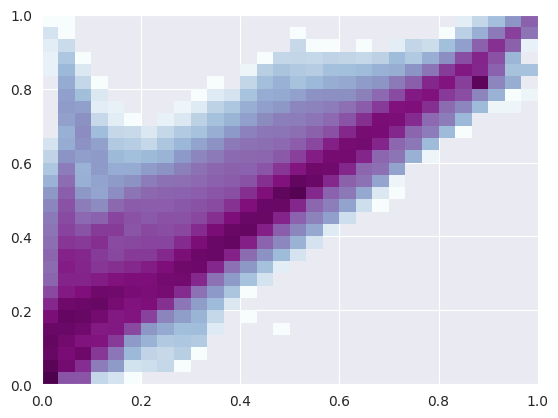

In [37]:
from matplotlib.colors import LogNorm
plt.hist2d(x=X['red'], y=X['nir'], bins=30, cmap='BuPu', norm=LogNorm()); 

На графике видно, что большинство пикселей-наблюдений выстроились в прямую линию с положительным наклоном, что указывает на положительную и сильную корреляцию. Однако ближе к левому верхнему углу графика сформировался кластер наблюдений с высокими значениями яркости в канале NIR и низкими значениями яркости в канале Red. Такой зависимостью обладает активно вегетирующая растительность. Возможно, нелинейная зависимость присутствует и между другими признаками, поэтому решено ввести квадратичные признаки, которые получаются путем возведения в квадрат значений исходных признаков и путем умножения значений одного признака на другого. В качестве степени возведения признаков выбрана вторая степень, так как при больших степенях матрица признаков становится перенасыщенной не интерпретируемыми признаками.

In [38]:
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
X_poly = pd.DataFrame(X_poly, columns=poly.get_feature_names_out())
X_poly

,1,blue,green,red,nir,ndvi,ndwi,whiteness,HOT,cloud_index_2,...,ndwi^2,ndwi whiteness,ndwi HOT,ndwi cloud_index_2,whiteness^2,whiteness HOT,whiteness cloud_index_2,HOT^2,HOT cloud_index_2,cloud_index_2^2
0,1.0,0.186519,0.165516,0.166646,0.187357,0.529253,0.469052,0.039365,0.218565,0.176509,...,0.220010,0.018464,0.102518,0.082792,0.001550,0.008604,0.006948,0.047771,0.038579,0.031156
1,1.0,0.159366,0.123463,0.137340,0.131312,0.488780,0.484597,0.068895,0.194241,0.137870,...,0.234835,0.033387,0.094129,0.066812,0.004747,0.013382,0.009499,0.037730,0.026780,0.019008
2,1.0,0.173424,0.150209,0.146276,0.137840,0.485154,0.521471,0.053548,0.212901,0.151937,...,0.271933,0.027924,0.111022,0.079231,0.002867,0.011400,0.008136,0.045327,0.032348,0.023085
3,1.0,0.175615,0.174449,0.133352,0.164593,0.552428,0.514535,0.086181,0.229739,0.162002,...,0.264746,0.044343,0.118209,0.083356,0.007427,0.019799,0.013962,0.052780,0.037218,0.026245
4,1.0,0.212069,0.223007,0.176768,0.205797,0.537941,0.520068,0.066596,0.258432,0.204410,...,0.270471,0.034635,0.134402,0.106307,0.004435,0.017211,0.013613,0.066787,0.052826,0.041784
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7077883,1.0,0.231748,0.195909,0.180689,0.167535,0.603303,0.789319,0.182401,0.282135,0.193970,...,0.623024,0.143972,0.222695,0.153104,0.033270,0.051462,0.035380,0.079600,0.054726,0.037624
7077884,1.0,0.235005,0.200340,0.185700,0.169705,0.585545,0.795016,0.172651,0.283636,0.197687,...,0.632050,0.137260,0.225495,0.157165,0.029808,0.048970,0.034131,0.080449,0.056071,0.039080
7077885,1.0,0.227507,0.198458,0.179873,0.165268,0.592154,0.805242,0.161622,0.274490,0.192777,...,0.648415,0.130145,0.221031,0.155232,0.026122,0.044364,0.031157,0.075345,0.052915,0.037163
7077886,1.0,0.221485,0.191358,0.172630,0.158372,0.590285,0.808948,0.172261,0.269699,0.185961,...,0.654396,0.139350,0.218172,0.150433,0.029674,0.046459,0.032034,0.072737,0.050153,0.034581


В новой матрице признаков оказалось 55 признаков — число признаков крайне избыточно. В качестве критерия выбора наилучших признаков выбран линейный коэффициент корреляции. Именно признаки с наиболее значимой корреляцией вносят больший вклад в прогноз с помощью таких моделей как логистическая регрессия и метод опорных векторов (с линейным ядром). Так, подсчитаны корреляции целевого бинарного признака (наличие/отсутствие облаков) со всеми независимыми признаками. Затем устанавливается порог значения коэффициента для извлечения только признаков с наибольшей корреляцией по абсолютному значению. В итоге признаки, абсолютное значение корреляции которых оказалось ниже порога, удаляются из матрицы признаков, и в матрице остаются только самые значимые признаки.

In [39]:
correlation_with_target = X_poly.apply(lambda x: x.corr(y))
threshold = 0.42 
selected_features = correlation_with_target[abs(correlation_with_target) > threshold].index.tolist()

print('Выбранные признаки: ', selected_features)
X_selected = X_poly[selected_features]

Выбранные признаки:  ['blue', 'HOT', 'blue ndwi', 'green ndwi', 'red ndwi', 'nir ndwi', 'ndwi HOT', 'ndwi cloud_index_2']


Среди выбранных признаков оказались:
- Яркость в синем канале `blue`
- Показатель трансформации дымки `HOT`
- Произведение яркости в синем канале и значения индекса NDWI `blue ndwi`
- Произведение яркости в зеленом канале и значения индекса NDWI `green ndwi`
- Произведение яркости в красном канале и значения индекса NDWI `red ndwi`
- Произведение яркости в ближнем инфракрасном канале и значения индекса NDWI `nir ndwi`
- Произведение значения индекса NDWI и показателя трансформации дымки `ndwi HOT`
- Произведение значения индекса NDWI и произведения значения индекса Cloud index 2 `ndwi cloud_index_2`

Заметно, что наиболее коррелируемые с целевым признаком переменные имеют вторую степень и что это в основном произведения практически всех признаков с водным индексом NDWI. Значение индекса NDWI для облаков варьируются в районе нуля. В то время как диапазон значений индекса для плотных облаков довольно узок, для облачной дымки он может приобретать как положительные значения (дымка над водой), так и отрицательные (дымка над растительностью, каменистой поверхностью). Так что невозможно однозначно сказать о линейной корреляции между целевым признаком и водным индексом, тем не менее данный признак при умножении с другими способен успешнее выделить облака.

Еще в ходе исследовательского анализа данных выявлено, что распределение спектральной яркости в четырех каналах ненормально. Это может сказаться на качестве выделения облаков алгоритмами машинного обучения, которые обычно показывают более высокое качество классификации при наборе нормально распределенных данных. Для решения проблемы применено квантильное преобразование:

In [40]:
qt = QuantileTransformer(n_quantiles=200, random_state=0, output_distribution='normal')
X_transformed = qt.fit_transform(X_selected)
X_transformed = pd.DataFrame(X_transformed, columns=qt.get_feature_names_out())

In [41]:
X_train = X_transformed[:384*384*38]
y_train = y[:384*384*38]

X_train.reset_index(drop=True, inplace=True)
y_train.reset_index(drop=True, inplace=True)

X_test = X_transformed[384*384*38:]
y_test = y[384*384*38:]

X_test.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)

На этапе исследовательского анализа данных был выявлен факт дисбаланса в распределении классов - значительное большинство пикселей не покрыто облаками. Так как для достижения баланса придется удалить значительно количество наблюдений, это может привести к ухудшению результата. Нарастим искусственно набор данных для избежания удаления: 

In [42]:
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

In [43]:
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

Спрогнозируем наличие\отсутствие облаков с помощью модели *логистической регрессии*:

In [44]:
logreg = LogisticRegression(n_jobs=-1)
logreg.fit(X_train, y_train)
y_pred_test = logreg.predict(X_test)

print("Precision:", round(precision_score(y_test, y_pred_test), 3))
print("Recall:", round(recall_score(y_test, y_pred_test), 3))
print("F1 score:", round(f1_score(y_test, y_pred_test), 3))

Precision: 0.499
Recall: 0.544
F1 score: 0.52


Модель логрегрессии показала менее удовлетворительный по сравнению с эмпирическими методами результаты выделения облаков на космических снимках. Метрики precision и recall достигли одного и то же значения — значит только половина положительных меток в действительности относится к положительным и половина действительно положительных меток была пропущена алгоритмом. В итоге значение F1 score оказалось самым низким на данный момент.

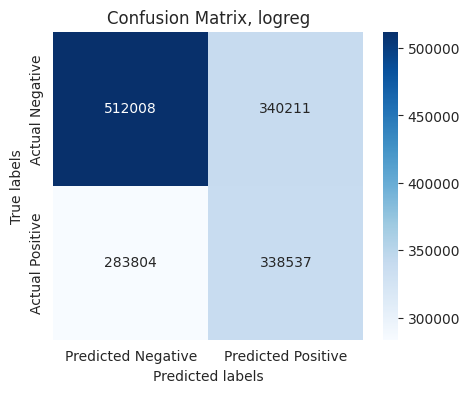

In [45]:
cm = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=['Predicted Negative', 'Predicted Positive'], yticklabels=['Actual Negative', 'Actual Positive'])
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix, logreg')
plt.show()

Ложноположительных предсказаний оказалось немногим больше ложноотрицательных, из-за чего значения precision и recall оказались практически равными.
Посмотрим на коэффициенты модели логистической регрессии и проведем их интерпретацию:

In [46]:
coefficients = logreg.coef_
intercept = logreg.intercept_
selected_features.insert(0, 'intercept')
coefficients = coefficients.tolist()[0]
coefficients.insert(0, intercept[0])

feature_imp = pd.DataFrame(data=coefficients, index=selected_features)
feature_imp

,0
intercept,-8.682648
blue,-21.205013
HOT,6.464296
blue ndwi,85.692467
green ndwi,-42.601073
red ndwi,-82.636754
nir ndwi,14.256219
ndwi HOT,4.349210
ndwi cloud_index_2,52.098935


Самым значимым признаком оказалось произведение яркости в синем канале на значение водного индекса. В данном признаке довольно сильно от остальных объектов выделяются плотные облака. В признаке `green ndwi` картина практически не меняется - в данном признаке снова выделяются более плотные облака. В признаке `ndwi HOT` облака приобрели отрицательные значения, в то время остальные объекты — положительные, что делает данный признак линейно разделимым.

Посмотрим на результаты прогноза для некоторых снимков. Для этого в начале необходимо собрать необходимые данные и преобразовать их, так как мы использовали преобразованные с помощью полинома признаки:

In [47]:
def transform_features(data):
    
    data['blue ndwi'] = data['blue'] * data['ndwi']
    data['green ndwi'] = data['green'] * data['ndwi']
    data['red ndwi'] = data['red'] * data['ndwi']
    data['nir ndwi'] = data['nir'] * data['ndwi']
    data['ndwi HOT'] = data['ndwi'] * data['HOT']
    data['ndwi cloud_index_2'] = data['ndwi'] * data['cloud_index_2']

    data.drop(['green', 'red', 'nir', 'ndvi', 'ndwi', 'whiteness', 'cloud_index_2'], axis=1, inplace=True)
    
    return data

In [48]:
logreg_preds = []
for i in range(10):
    lst_X[i].drop('cloud', axis=1, inplace=True)
    default_data = pd.concat((lst_X[i], indices_dfs[i], flat_cloud_index_2[i]), axis=1)
    transformed_data = transform_features(default_data)
    transformed_data = qt.transform(transformed_data)
    transformed_data = scaler.transform(transformed_data)
    logreg_pred = logreg.predict(transformed_data)
    logreg_pred = logreg_pred.reshape((384, 384))
    logreg_preds.append(logreg_pred)

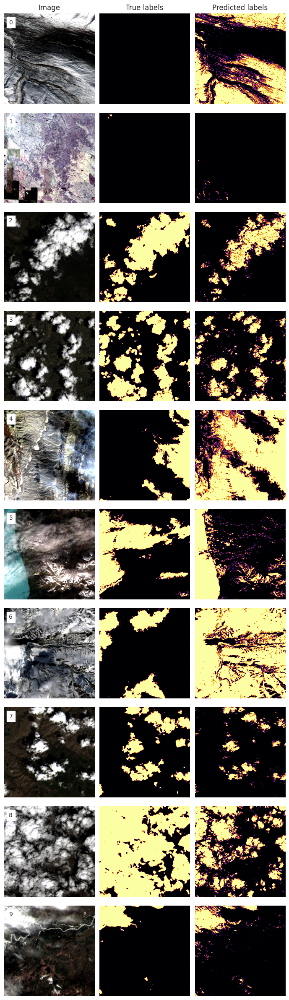

In [49]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(7, 24))
for i in range(10):
    ep.plot_rgb(composite_images[i], rgb=[2, 1, 0], ax=axes[i, 0], stretch=True, str_clip=4)
    axes[i, 0].axis('off')
    axes[i, 0].text(20, 45, str(i), bbox=dict(facecolor='white'))
    axes[i, 1].imshow(image_datasets[i][:, :, 4], cmap='inferno')
    axes[i, 1].axis('off')
    axes[i, 2].imshow(logreg_preds[i], cmap='inferno')
    axes[i, 2].axis('off')
axes[0, 0].set_title('Image')
axes[0, 1].set_title('True labels')
axes[0, 2].set_title('Predicted labels')
plt.tight_layout()

Модель логистической регрессии, как и предыдущие модели, показала близкий к истинному результат для снимков с плотными облаками, причем она часто недооценивает облачные пиксели на таких снимках. Стоит отметить, что логрегрессия это один из немногих алгоритмов, который смог отделить от облаков с/х поля на снимке № 1, тем самым не допустить ошибочный прогноз меток пикселей на данном снимке. Но и эта модель не может адекватно отделять снег и песок от облаков, как это видно на снимках № 4 и 6. 

Необходимо также отметить факт низкой степени интерпретации получившейся модели логистической регрессии ввиду применения низкоинтерпретируемых признаков, возведенных во вторую степень.

Сохраним логистическую регрессию в файл модели:

In [50]:
joblib.dump(logreg, 'logistic_regression.joblib')

['logistic_regression.joblib']

Применим *наивный баесовский классификатор* для нашего набора данных:

In [51]:
nb = GaussianNB()
nb.fit(X_train, y_train)
y_pred = nb.predict(X_test)

print("Precision:", round(precision_score(y_test, y_pred), 3))
print("Recall:", round(recall_score(y_test, y_pred), 3))
print("F1 score:", round(f1_score(y_test, y_pred), 3))

Precision: 0.549
Recall: 0.704
F1 score: 0.617


Наивный байес показал самый лучший результат среди алгоритмов машинного обучения, достигнув значения F1 score на уровне 0.617. Значение precision оказалось значительно ниже recall, то есть данный алгоритм с большей вероятностью переоценивает положительные метки у пикселей, чем недооценивает. Так, только чуть более половины пикселей, выделенных как облачные, действительно относятся к облакам и в то же время лишь около 30% истинно положительных меток были предсказаны моделью как отрицательные.

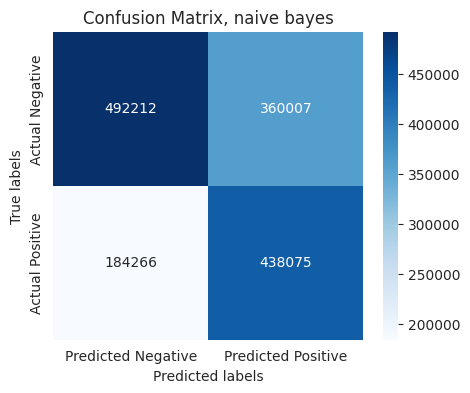

In [52]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=['Predicted Negative', 'Predicted Positive'], yticklabels=['Actual Negative', 'Actual Positive'])
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix, naive bayes')
plt.show()

Преобладание переоценки над недооценкой положительных меток отлично наблюдается на матрице несоответствий. Посмотрим на результаты предсказания облаков на снимках:

In [53]:
nb_preds = []
for i in range(10):
    default_data = pd.concat((lst_X[i], indices_dfs[i], flat_cloud_index_2[i]), axis=1)
    transformed_data = transform_features(default_data)
    transformed_data = qt.transform(transformed_data)
    transformed_data = scaler.transform(transformed_data)
    nb_pred = nb.predict(transformed_data)
    nb_pred = nb_pred.reshape((384, 384))
    nb_preds.append(nb_pred)

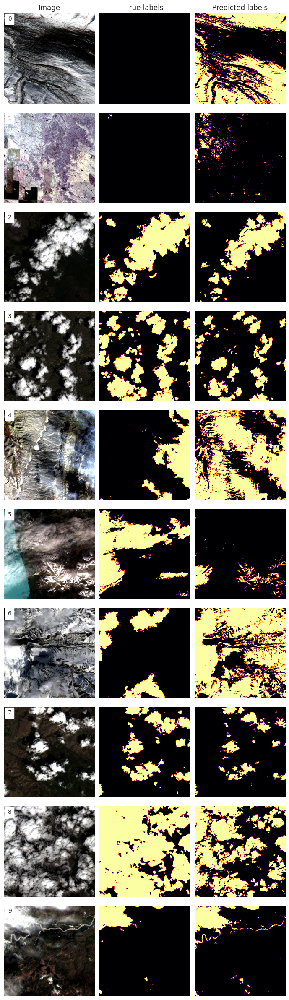

In [54]:
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(7, 24))
for i in range(10):
    ep.plot_rgb(composite_images[i], rgb=[2, 1, 0], ax=axes[i, 0], stretch=True, str_clip=4)
    axes[i, 0].axis('off')
    axes[i, 0].text(15, 30, str(i), bbox=dict(facecolor='white'))
    axes[i, 1].imshow(image_datasets[i][:, :, 4], cmap='inferno')
    axes[i, 1].axis('off')
    axes[i, 2].imshow(nb_preds[i], cmap='inferno')
    axes[i, 2].axis('off')
axes[0, 0].set_title('Image')
axes[0, 1].set_title('True labels')
axes[0, 2].set_title('Predicted labels')
plt.tight_layout()

Результаты выделения облаков байесовским классификатором практически ничем не отличаются от предыдущих результатов. Проблема отделения облаков от заснеженных, песчаный и каменистых поверхностей все еще остается. Сохраним обученную модель в файл для дальнейшего использования в плагине QGIS:

In [55]:
joblib.dump(nb, 'naive_bayes.joblib')

['naive_bayes.joblib']